<a href="https://colab.research.google.com/github/MavClarito/Emerging-Tech-1/blob/main/Casidsid%2C_Castillo%2C_Clarito_Activity_10_Object_Detection_and_Recognition_Techniques.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Technological Institute of the Philippines | Quezon City - Computer Engineering
--- | ---
Course Code: | CPE 018
Code Title: | Emerging Technologies in CpE 1 - Fundamentals of Computer Vision
1st Semester | AY 2023-2024
<hr> | <hr>
<u>**Activity 10** | **Object Detection and Recognition Techniques**
**Name** | Casidsid, Judd Amiel
| Castillo, Mark Laurence
| Clarito, Vincent Maverick
**Section** | CPE31S2
**Date Performed**: | 11/26/2023
**Date Submitted**: | 11/27/2023
**Instructor**: | Engr. Roman M. Richard

<hr>

## 1. Objectives

This activity aims to introduce students to object detection and recongition through the use of histogram of gradients (HoG), image pyramids and sliding windows in OpenCV.

## 2. Intended Learning Outcomes (ILOs)
After this activity, the students should be able to:
* Demonstrate object detection and recognition using histogram of gradients, image pyramids and sliding windows in OpenCV.
* Evaluate the performance of the object detection and recognition techniques in OpenCV.

## 3. Procedures and Outputs

When it comes to recognizing and detecting objects, there are a number of techniques used in computer vision, which we'll be examining:
* Histogram of Oriented Gradients
* Image pyramids
* Sliding windows

Unlike feature detection algorithms, these are not mutually exclusive techniques, rather, they are complimentary. You can perform a Histogram of Oriented Gradients (HOG) while applying the sliding windows technique. So, let's take a look at HOG first and understand what it is.

### History of Gradients (HoG) Descriptors

HOG is a feature descriptor, so it belongs to the same family of algorithms, such as SIFT, SURF, and ORB.

It is used in image and video processing to detect objects. Its internal mechanism is really clever; an image is divided into portions and a gradient for each portion is calculated. We've observed a similar approach when we talked about face recognition through LBPH.

HOG, however, calculates histograms that are not based on color values, rather, they are based on gradients. As HOG is a feature descriptor, it is capable of delivering the type of information that is vital for feature matching and object detection/recognition.

Before diving into the technical details of how HOG works, let's first take a look at how HOG sees the world; here is an image of a truck:

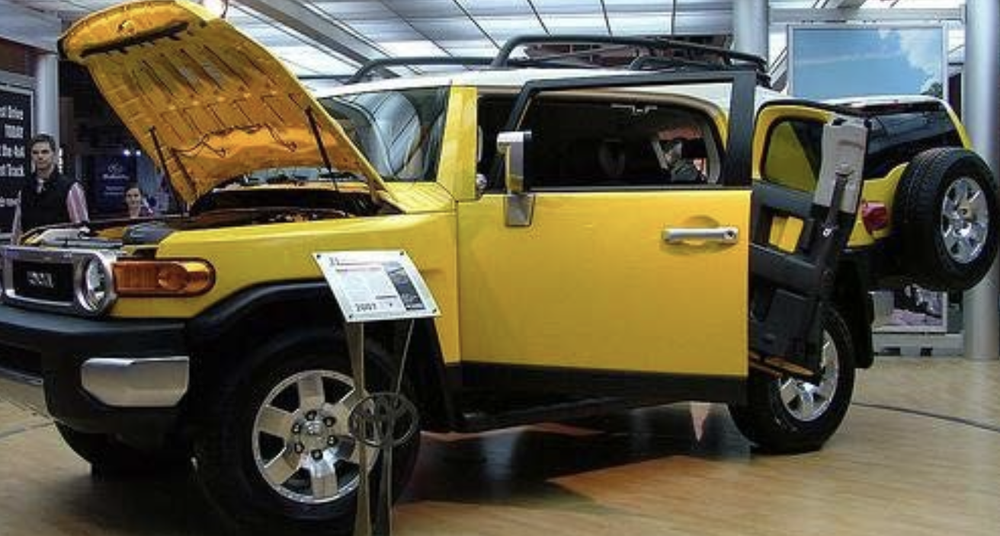

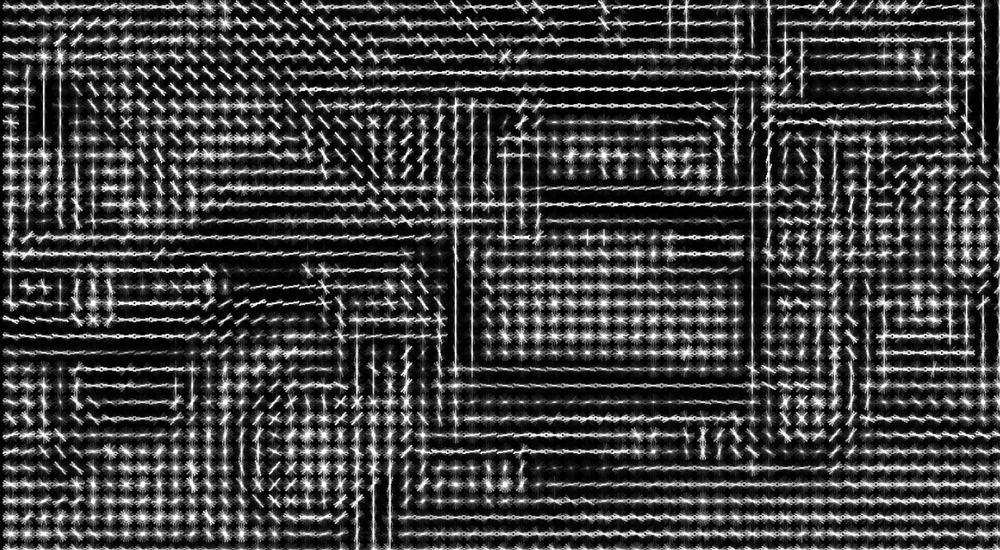

**Question: Here you are shown the original image and how HOG sees the image. Analyze the output and provide a description. Are you able to see that it is the same image?**

The extrapolation of histograms into descriptors is quite a complex process.
- First, local histograms for each cell are calculated. The cells are grouped into larger regions called blocks. These blocks can be made of any number of cells, but Dalal and Triggs found that 2x2 cell blocks yielded the best results when performing people detection.
- A block-wide vector is created so that it can be normalized, accounting for variations in illumination and shadowing (a single cell is too small a region to detect such variations). This improves the accuracy of detection as it reduces the illumination and shadowing difference between the sample and the block being examined.
- Simply comparing cells in two images would not work unless the images are identical (both in terms of size and data).

There are two main problems to resolve:
1. Location
2. Scale

**The Scale Issue**

Imagine, for example, if your sample was a detail (say, a bike) extrapolated from a larger image, and you're trying to compare the two pictures. You would not obtain the same gradient signatures and the detection would fail (even though the bike is in both pictures).

**The Location Issue**

Once we've resolved the scale problem, we have another obstacle in our path: a potentially detectable object can be anywhere in the image, so we need to scan the entire image in portions to make sure we can identify areas of interest, and within these areas, try to detect objects. Even if a sample image and object in the image are of identical size, there needs to be a way to instruct OpenCV to locate this object. So, the rest of the image is discarded and a comparison is made on potentially matching regions.

*To obviate these problems, we need to familiarize ourselves with the concepts of image pyramid and sliding windows.*

### Image Pyramids

Many of the algorithms used in computer vision utilize a concept called pyramid. An image pyramid is a multiscale representation of an image. This diagram should
help you understand this concept:

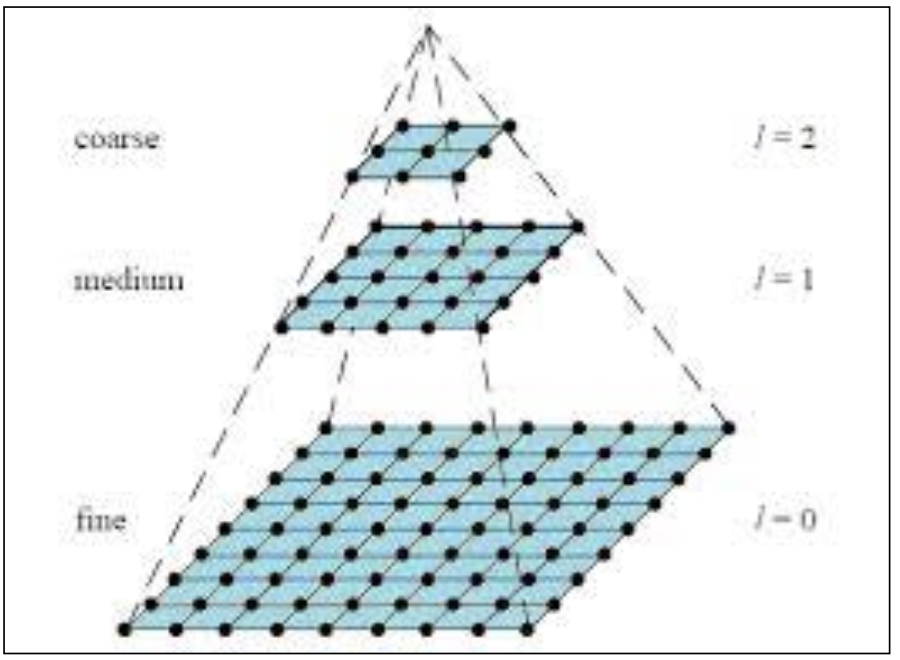

A multiscale representation of an image, or an image pyramid, helps you resolve the problem of detecting objects at different scales. The importance of this concept is easily explained through real-life hard facts, such as it is extremely unlikely that an object will appear in an image at the exact scale it appeared in our sample image.
Moreover, you will learn that object classifiers (utilities that allow you to detect objects in OpenCV) need training, and this training is provided through image databases made up of positive matches and negative matches. Among the positives, it is again unlikely that the object we want to identify will appear in the same scale throughout the training dataset.

**Follow the steps and create a function that can make an image Pyramid**:

1. Take an image.
2. Resize (smaller) the image using an arbitrary scale parameter.
3. Smoothen the image (using Gaussian blurring).
4. If the image is larger than an arbitrary minimum size, repeat the process from step 1.

Demonstrate by creating a function and showing the different scales of the image.

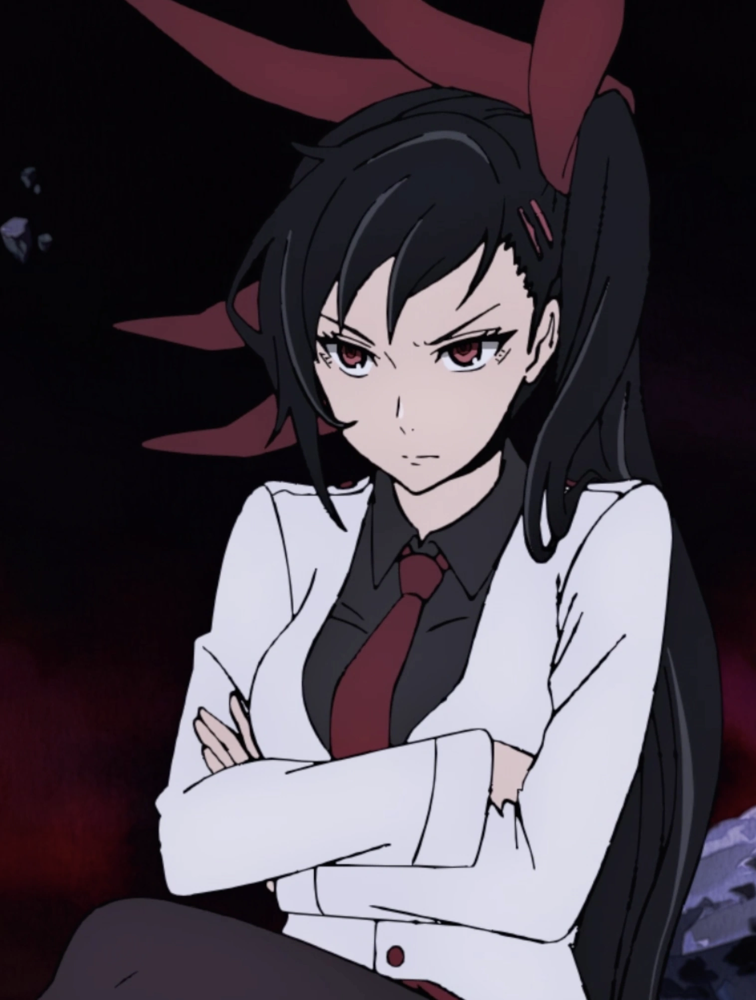

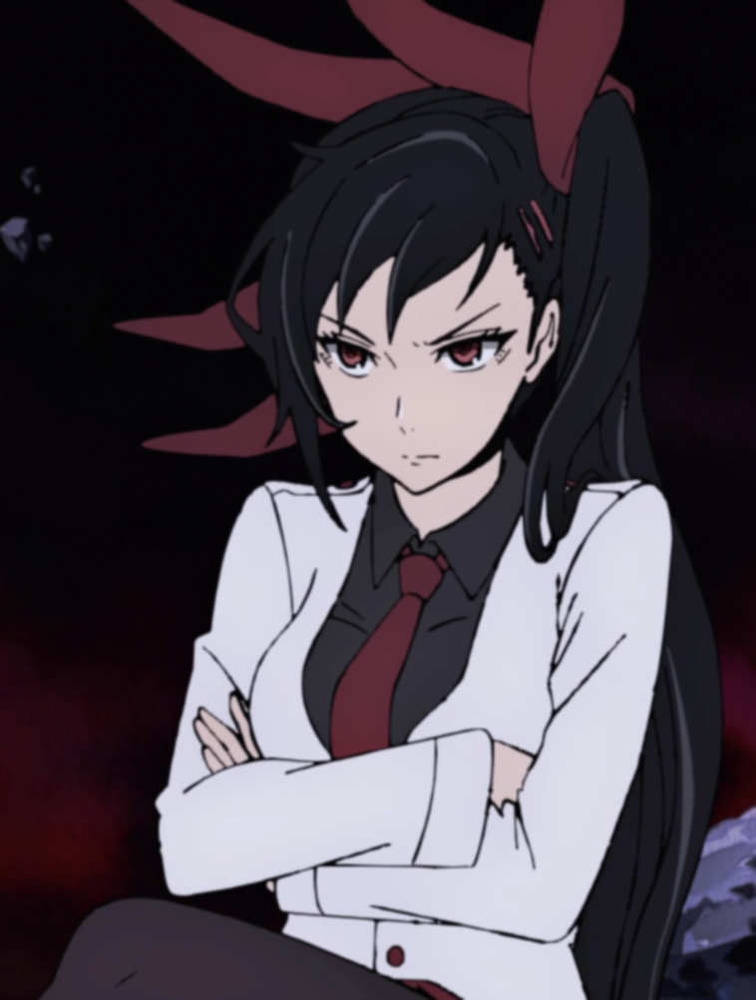

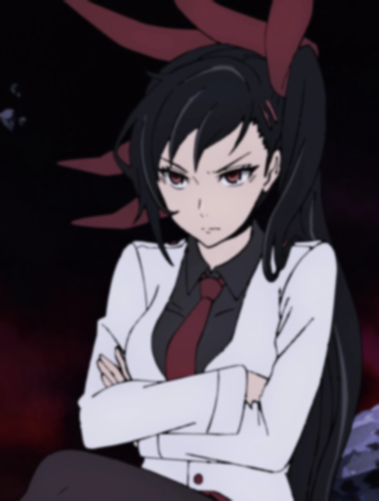

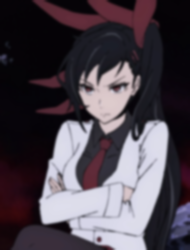

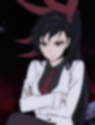

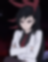

In [ ]:
# Your Code Here
import cv2
from google.colab.patches import cv2_imshow


def create_image_pyramid(image_path, scale_factor=0.5, min_size=(30, 30)):
    image_pyramid = []
    image = cv2.imread(image_path)

    while image.shape[0] >= min_size[0] and image.shape[1] >= min_size[1]: #Step 4
        image_pyramid.append(image)
        image = cv2.resize(image, None, fx=scale_factor, fy=scale_factor) #Step 2
        image = cv2.GaussianBlur(image, (5, 5), 0) #Step 3

    return image_pyramid

image_path = '/content/TowerOfGodWaifu.png' #Step 1
pyramid = create_image_pyramid(image_path, scale_factor=0.5, min_size=(30, 30))

# Access different levels of the pyramid and display. It shows 6 levels of the image
for i, level in enumerate(pyramid):
    cv2_imshow(level)


**Question: How does the performance of your functions in obtaining the image pyramid perform in iterations of the image that decrease until the scale factor is achieved?**



*   The performance of the function create_image_pyramid in obtaining the image pyramid is demonstrated by iterating through different levels of the pyramid. The function starts with the original image and successively resizes and blurs it until the minimum size criteria are met.



### Sliding Windows

Sliding windows is a technique used in computer vision that consists of examining the shifting portions of an image (sliding windows) and operating detection on those using image pyramids. This is done so that an object can be detected at a multiscale level.

Sliding windows resolves location issues by scanning smaller regions of a larger image, and then repeating the scanning on different scales of the same image.

With this technique, each image is decomposed into portions, which allows discarding portions that are unlikely to contain objects, while the remaining portions are classified.

There is one problem that emerges with this approach, though: **overlapping regions**.

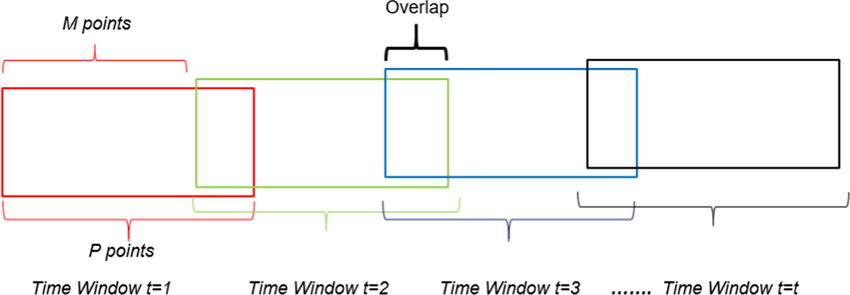

Here's where non-maximum suppression comes into play: given a set of overlapping regions, we can suppress all the regions that are not classified with the maximum score.

**Question: Research on the topic and provide ample discussion, what is non-maximum (or non-maxima) suppression? Provide examples and code.**

* In the context of computer vision (and as the name suggests), a sliding window is a rectangular region of fixed width and height that “slides” across an image.

* Non Maximum Suppression on the other hand is a computer vision method that selects a single entity out of many overlapping entities (for example bounding boxes in object detection). The criteria is usually discarding entities that are below a given probability bound.



**Example:**

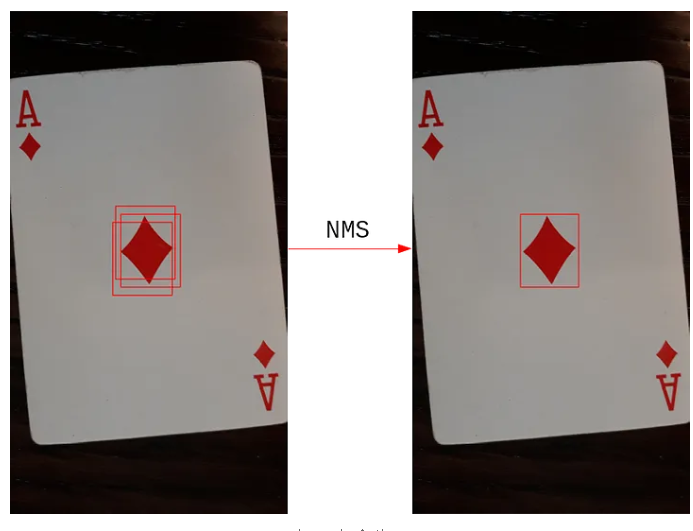

In [ ]:
#Sample code:

import pyautogui
import cv2
import numpy as np
import os
import time
import matplotlib.pyplot as plt
import copy

def NMS(boxes, overlapThresh = 0.4):
    #return an empty list, if no boxes given
    if len(boxes) == 0:
        return []
    x1 = boxes[:, 0]  # x coordinate of the top-left corner
    y1 = boxes[:, 1]  # y coordinate of the top-left corner
    x2 = boxes[:, 2]  # x coordinate of the bottom-right corner
    y2 = boxes[:, 3]  # y coordinate of the bottom-right corner
    # compute the area of the bounding boxes and sort the bounding
    # boxes by the bottom-right y-coordinate of the bounding box
    areas = (x2 - x1 + 1) * (y2 - y1 + 1) # We have a least a box of one pixel, therefore the +1
    indices = np.arange(len(x1))
    for i,box in enumerate(boxes):
        temp_indices = indices[indices!=i]
        xx1 = np.maximum(box[0], boxes[temp_indices,0])
        yy1 = np.maximum(box[1], boxes[temp_indices,1])
        xx2 = np.minimum(box[2], boxes[temp_indices,2])
        yy2 = np.minimum(box[3], boxes[temp_indices,3])
        w = np.maximum(0, xx2 - xx1 + 1)
        h = np.maximum(0, yy2 - yy1 + 1)
        # compute the ratio of overlap
        overlap = (w * h) / areas[temp_indices]
        if np.any(overlap) > treshold:
            indices = indices[indices != i]
    return boxes[indices].astype(int)

def bounding_boxes(image, template):
    (tH, tW) = template.shape[:2]             # getting height and width of template
    imageGray = cv2.cvtColor(image, 0)        # convert the image to grayscale
    templateGray = cv2.cvtColor(template, 0)  # convert the template to grayscale

    result = cv2.matchTemplate(imageGray, templateGray, cv2.TM_CCOEFF_NORMED)  # template matching return the correlatio
    (y1, x1) = np.where(result >= treshold)  # object is detected, where the correlation is above the treshold
    boxes = np.zeros((len(y1), 4))      # construct array of zeros
    x2 = x1 + tW                       # calculate x2 with the width of the template
    y2 = y1 + tH                       # calculate y2 with the height of the template
    # fill the bounding boxes array
    boxes[:, 0] = x1
    boxes[:, 1] = y1
    boxes[:, 2] = x2
    boxes[:, 3] = y2
    return boxes.astype(int)

def draw_bounding_boxes(image,boxes):
    for box in boxes:
        image = cv2.rectangle(copy.deepcopy(image),box[:2], box[2:], (255,0,0), 3)
    return image

if __name__ == "__main__":
    time.sleep(2)
    treshold = 0.8837 # the correlation treshold, in order for an object to be recognised
    template_diamonds = plt.imread(r"templates/ace_diamonds_plant_template.jpg")

    ace_diamonds_rotated = plt.imread(r"images/ace_diamonds_table_rotated.jpg")

    boxes_redundant = bounding_boxes(ace_diamonds_rotated, template_diamonds) # calculate bounding boxes
    boxes = NMS(boxes_redundant)                                            # remove redundant bounding boxes
    overlapping_BB_image = draw_bounding_boxes(ace_diamonds_rotated,
                                               boxes_redundant)  # draw image with all redundant bounding boxes
    segmented_image = draw_bounding_boxes(ace_diamonds_rotated,boxes)           # draw the bounding boxes onto the image
    plt.imshow(overlapping_BB_image)
    plt.show()
    plt.imshow(segmented_image)
    plt.show()

Note: This won't work since it still doesn't have image pathing or image input in order for the code to fully functionalize.

References:

* https://paperswithcode.com/method/non-maximum-suppression#:~:text=Non%20Maximum%20Suppression%20is%20a,below%20a%20given%20probability%20bound.

* https://towardsdatascience.com/non-maxima-suppression-139f7e00f0b5


The general approach behind non-maximum suppression is as follows:
1. Once an image pyramid has been constructed, scan the image with the sliding window approach for object detection.
2. Collect all the current windows that have returned a positive result (beyond a certain arbitrary threshold), and take a window, W, with the highest response.
3. Eliminate all windows that overlap W significantly.
4. Move on to the next window with the highest response and repeat the
process for the current scale.

**Question: Demonstrate the above given steps using a custom image and creating code in Python using OpenCV**

In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Mon Nov 27 10:33:24 2023

@author: Mav
"""

import time
import cv2
import imutils

def pyramid(image, scale=1.5, minSize=(30, 30)):
	yield image

	while True:
		# compute the new dimensions of the image and resize it
		w = int(image.shape[1] / scale)
		image = imutils.resize(image, width=w)
		# if the resized image does not meet the supplied minimum
		# size, then stop constructing the pyramid
		if image.shape[0] < minSize[1] or image.shape[1] < minSize[0]:
			break
		# yield the next image in the pyramid
		yield image
def sliding_window(image, stepSize, windowSize):
	# slide a window across the image
	for y in range(0, image.shape[0], stepSize):
		for x in range(0, image.shape[1], stepSize):
			# yield the current window
			yield (x, y, image[y:y + windowSize[1], x:x + windowSize[0]])

image_path = 'C:/Users/Mav/Documents/Experiment 11/TowerOfGodWaifu.png'
image = cv2.imread(image_path)
(winW, winH) = (128, 128)

# loop over the image pyramid
for resized in pyramid(image, scale=1.5):
    # loop over the sliding window for each layer of the pyramid
    for (x, y, window) in sliding_window(resized, stepSize=32, windowSize=(winW, winH)):
        # if the window does not meet our desired window size, ignore it
        if window.shape[0] != winH or window.shape[1] != winW:
            continue

        clone = resized.copy()
        cv2.rectangle(clone, (x, y), (x + winW, y + winH), (0, 255, 0), 2)
        cv2.imshow("Window", clone)

        key = cv2.waitKey(1) & 0xFF
        if key == ord('q'):  # Press 'q' to close the window
            cv2.destroyAllWindows()
            exit(0)

        time.sleep(0.025)

Level 0:

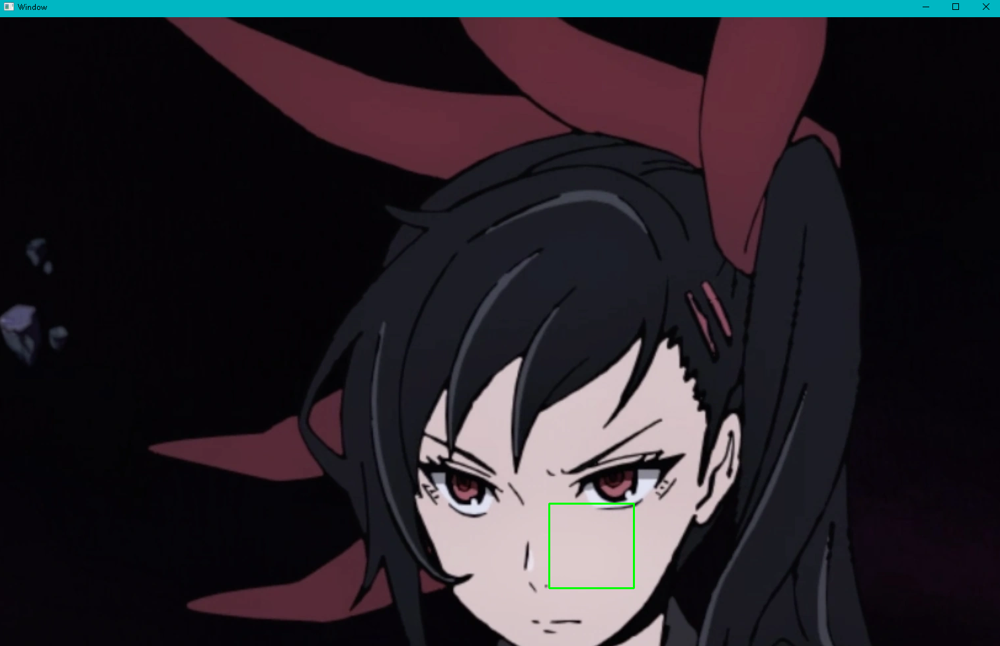

Level 1:

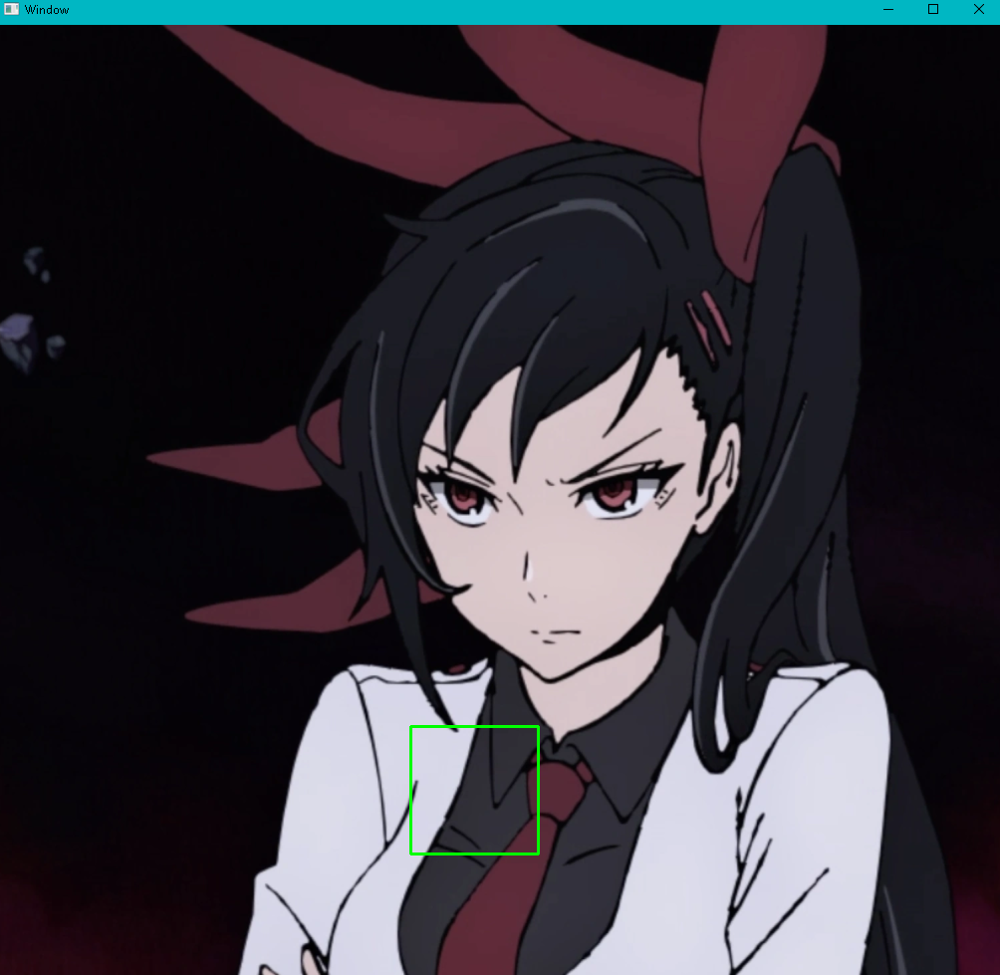

Level 2:

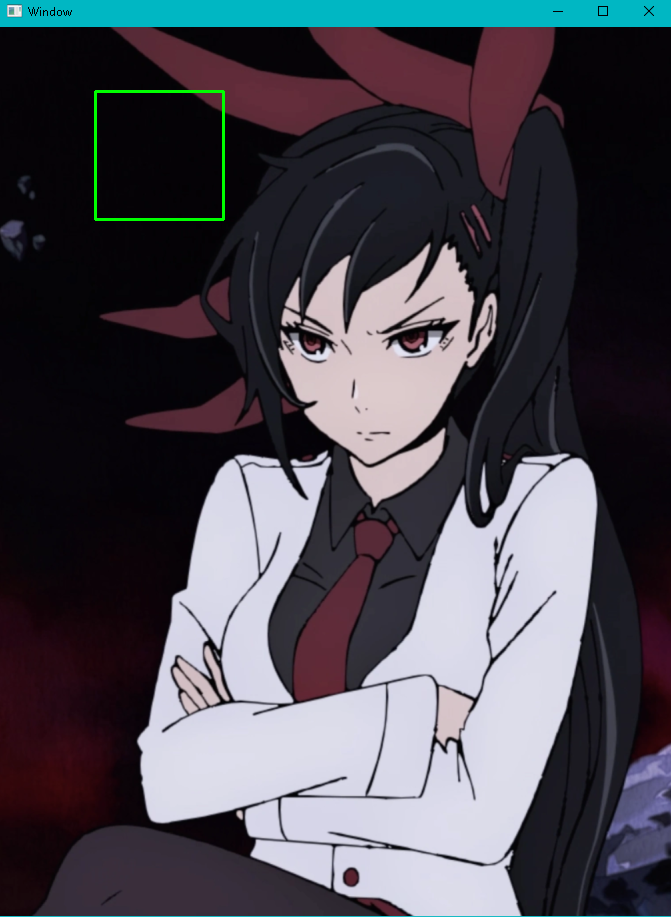

Level 3:

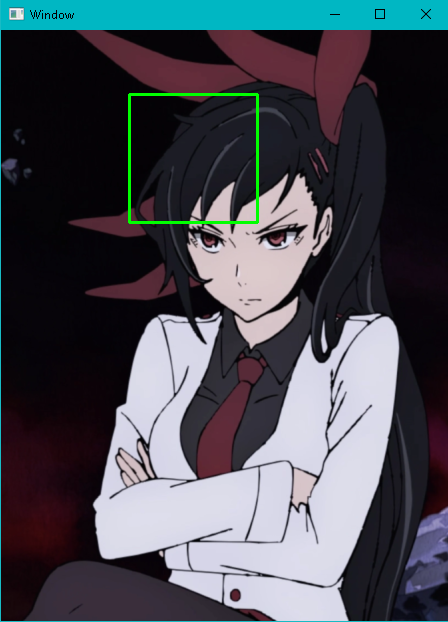

Level 4:

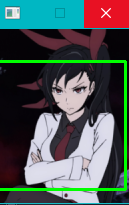

Remarks: At this point it only reached 5 levels and it became unresponsive and Its probably because the static rectangle couldn't fit into the resized window/image in order for it to slide.

Reference: https://pyimagesearch.com/2015/03/23/sliding-windows-for-object-detection-with-python-and-opencv/

## 4. Supplementary Activity

Perform **People Detection** using the aforementioned methods.

Your output should display bounding boxes around people detected. Your task is:
* Debug the code if your intended output is not being displayed.
* Enumerate the problems encountered and actions taken.
* Evaluate the performance of the object detection technique.



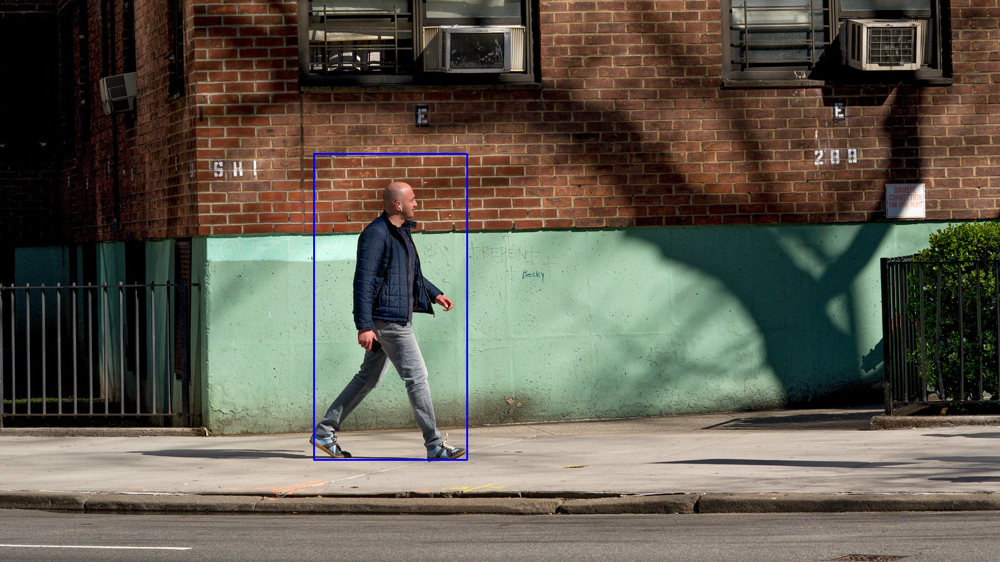

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def is_inside(o, i):
    ox, oy, ow, oh = o
    ix, iy, iw, ih = i
    return ox > ix and oy > iy and ox + ow < ix + iw and oy + oh < iy + ih

def draw_person(image, person):
    x, y, w, h = person
    cv2.rectangle(image, (x, y), (x + w, y + h), (255, 0, 0), 2)

img = cv2.imread("people.jpg")
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())
found, w = hog.detectMultiScale(img)

found_filtered = []

for ri, r in enumerate(found):
    for qi, q in enumerate(found):
        if ri != qi and is_inside(r, q):
            break
    else:
        found_filtered.append(r)

for person in found_filtered:
    draw_person(img, person)

cv2_imshow(img)

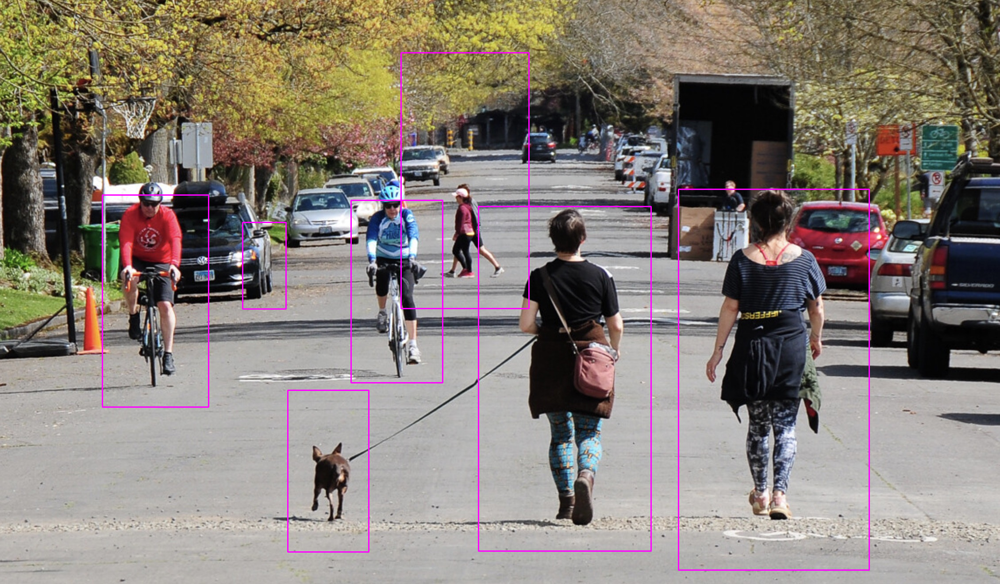

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def is_inside(o, i):
    ox, oy, ow, oh = o
    ix, iy, iw, ih = i
    return ox > ix and oy > iy and ox + ow < ix + iw and oy + oh < iy + ih

def draw_person(image, person):
    x, y, w, h = person
    cv2.rectangle(image, (x, y), (x + w, y + h), (255, 0, 255), 2)

img = cv2.imread("people2.jpg")
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())
found, w = hog.detectMultiScale(img)

found_filtered = []

for ri, r in enumerate(found):
    for qi, q in enumerate(found):
        if ri != qi and is_inside(r, q):
            break
    else:
        found_filtered.append(r)

for person in found_filtered:
    draw_person(img, person)

cv2_imshow(img)

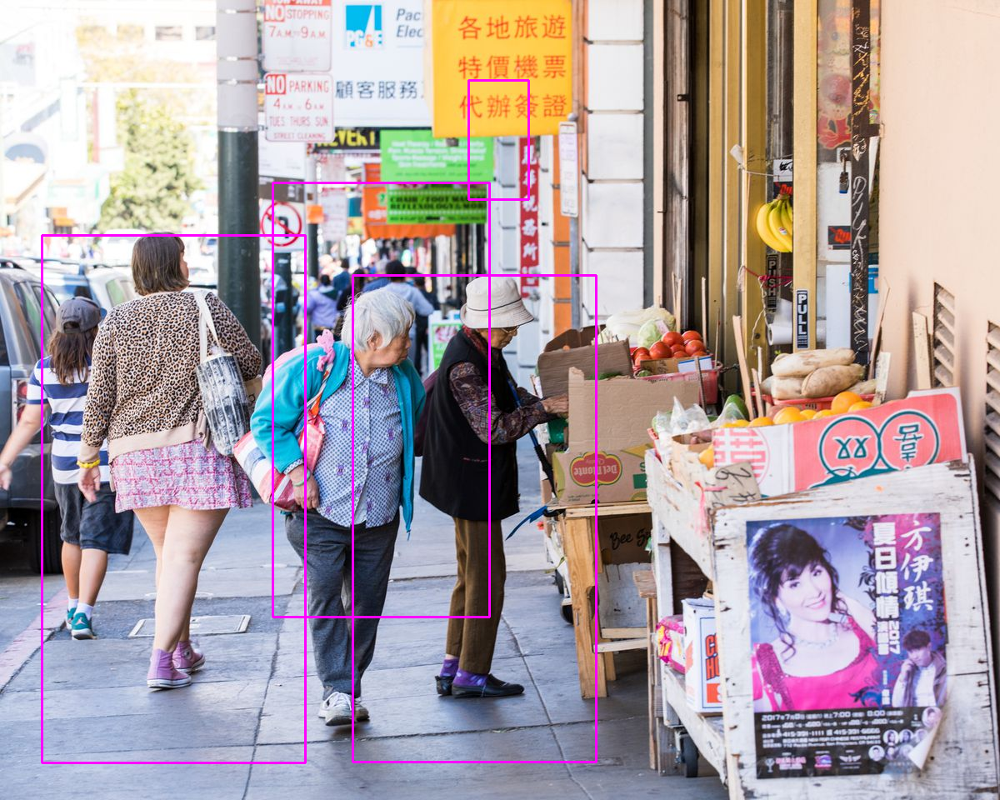

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def is_inside(o, i):
    ox, oy, ow, oh = o
    ix, iy, iw, ih = i
    return ox > ix and oy > iy and ox + ow < ix + iw and oy + oh < iy + ih

def draw_person(image, person):
    x, y, w, h = person
    cv2.rectangle(image, (x, y), (x + w, y + h), (255, 0, 255), 2)

img = cv2.imread("staticpeep.jpg")
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())
found, w = hog.detectMultiScale(img)

found_filtered = []

for ri, r in enumerate(found):
    for qi, q in enumerate(found):
        if ri != qi and is_inside(r, q):
            break
    else:
        found_filtered.append(r)

for person in found_filtered:
    draw_person(img, person)

cv2_imshow(img)

Remarks: I only changed the "cv2.show" into a directory of google collab patches (cv2_imshow) as well as the pathing of the image. Although it misfunction whenever the saved image is converted from the original into a new type. Another factor is the size of the image(pixels) and the clarity of the image.

## 5. Summary, Conclusions and Lessons Learned


* Casidsid:  I gained insights into the significance of methods like Histogram of Oriented Gradients (HOG) and Non-Maximum Suppression (NMS) in accurately identifying and localizing objects in images.

* Castillo: This activity has provided valuable practical skills in computer vision, paving the way for more advanced applications in the field.

* Clarito: The addition of sliding windows enhanced the approach by systematically scanning through the image at different scales, providing a comprehensive method for object detection across various sizes. This broadened my understanding of computer vision which can be applied in real life scenarios.



<hr/>

***Proprietary Clause***

*Property of the Technological Institute of the Philippines (T.I.P.). No part of the materials made and uploaded in this learning management system by T.I.P. may be copied, photographed, printed, reproduced, shared, transmitted, translated, or reduced to any electronic medium or machine-readable form, in whole or in part, without the prior consent of T.I.P.*